In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import itertools
%matplotlib inline

In [2]:
DATA_DIR = "./"
DATA_FILENAMES = {"bluetooth": "bt_symmetric.csv",
                  "calls": "calls.csv",
                  "sms": "sms.csv",
                  "facebook_friends": "fb_friends.csv",
                  "genders": "genders.csv"}

In [3]:
def LoadData(data_filename, data_dir):
    '''Loads data from |data_dir|/|data_filename|. Returns Pandas dataframe.'''
    return pd.read_csv(os.path.join(data_dir, data_filename))  

In [62]:
df_bt = LoadData(DATA_FILENAMES["bluetooth"], DATA_DIR)
# data cleaning: removing positive signal intensities
df_bt = df_bt[df_bt["rssi"] <= 0]
print("bluetooth\n", df_bt.head())

df_calls = LoadData(DATA_FILENAMES["calls"], DATA_DIR)
print("\ncalls\n", df_calls.head())

df_sms = LoadData(DATA_FILENAMES["sms"], DATA_DIR)
print("\nsms\n", df_sms.head())

df_facebook_friends = LoadData(DATA_FILENAMES["facebook_friends"], DATA_DIR)
# data cleaning: removing self-friendships
df_facebook_friends = df_facebook_friends[df_facebook_friends["user_b"] != df_facebook_friends["# user_a"]]
print("\nfacebook friends\n", df_facebook_friends.head())

df_genders = LoadData(DATA_FILENAMES["genders"], DATA_DIR)
print("\ngenders\n", df_genders.head())

bluetooth
    # timestamp  user_a  user_b  rssi
0            0       0      -1     0
1            0       1      -1     0
2            0       2      -1     0
3            0       3      -2   -88
4            0       5      -1     0

calls
    timestamp  caller  callee  duration
0        184     300     301       121
1       3920     512     299       670
2       5623     301     300       504
3       9252     401     457        -1
4      15466     512       0         5

sms
    timestamp  sender  recipient
0         18     370        512
1         37     512        370
2        126     370        512
3        134       0        512
4        312     137        136

facebook friends
    # user_a  user_b
0         0     512
1         0     263
2         0     525
3         0     285
4         0     543

genders
    # user  female
0       0       0
1       2       0
2       3       0
3       4       0
4       5       0


In [5]:
df_bt.loc[df_bt["user_b"] >= 0]

,# timestamp,user_a,user_b,rssi
15,0,21,20,-73
34,0,47,19,-86
36,0,49,48,-62
51,0,69,44,-87
66,0,90,64,-96
...,...,...,...,...
5474280,2418900,702,194,-83
5474281,2418900,702,259,-58
5474282,2418900,702,294,-94
5474283,2418900,702,359,-94


In [7]:
nx.__version__

'2.8.3'

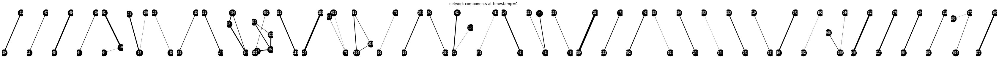

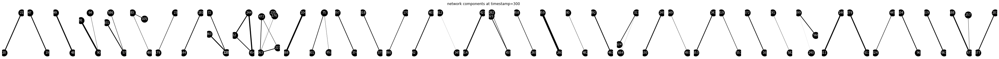

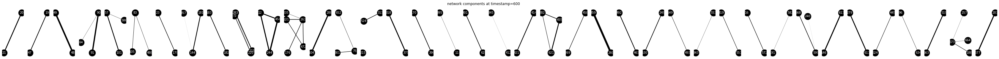

In [11]:
def VisualizeBluetoothNetwork(df_bt, timestamp):
    """ Plots each connected component in |df_bt| network at |timestamp|."""
    # NetworkX graph to plot the results.
    G = nx.Graph()

    # In-study users (id >= 0) at given timestamp.
    in_study_users_at_timestamp = df_bt[(df_bt["# timestamp"] == timestamp) & (df_bt["user_b"] >= 0)]#[["user_a", "user_b", "rssi"]]

    # Builds an undirected network of the in-study users.
    for index,row in in_study_users_at_timestamp.iterrows():
        user_a = row["user_a"]
        user_b = row["user_b"]
        rssi = row["rssi"]
        G.add_edge(user_a, user_b, weight=rssi)

    # For clarity, we consier each connected component separately.  
    connected_components = [G.subgraph(c) for c in nx.connected_components(G)]
    fig, axs = plt.subplots(1, len(connected_components), figsize=(60, 3), squeeze=False)
    axs = axs.flatten()

    # Plots the connected components of the network.
    fig.suptitle("network components at timestamp={}".format(timestamp))
    [
      nx.draw(
          connected_component,
          # Positions of nodes are calculatued using spring layout.
          pos=nx.spring_layout(connected_component, scale=0.2),
          ax=axs[i],
          # Width of the edges is based on higher RSSI = stronger edge.
          width=[(100 + connected_component[u][v]["weight"]) / 10.0
                 for u, v in connected_component.edges()],
          node_size=500,
          node_color="black",
          with_labels=True,
          font_size=10,
          font_color="white")
      for i, connected_component in enumerate(connected_components)
    ]

    return G


prova = VisualizeBluetoothNetwork(df_bt, 0)
prova1 = VisualizeBluetoothNetwork(df_bt, 300)
prova2 = VisualizeBluetoothNetwork(df_bt, 600)

In [34]:
df_bt_daily = df_bt.copy()
df_bt_daily["# timestamp"] = df_bt["# timestamp"] // (60*60*24)
df_bt_daily

,# timestamp,user_a,user_b,rssi
0,0,0,-1,0
1,0,1,-1,0
2,0,2,-1,0
3,0,3,-2,-88
4,0,5,-1,0
...,...,...,...,...
5474284,27,702,371,-79
5474285,27,703,-1,0
5474286,27,704,-1,0
5474287,27,705,-2,-90


<ipython-input-64-d54fd6208ea3>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, len(connected_components), figsize=(60, 3), squeeze=False)


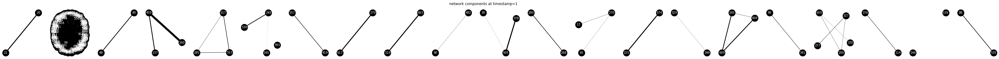

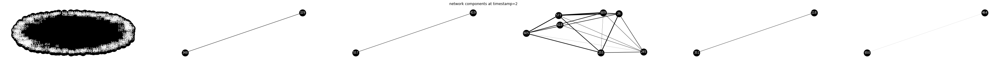

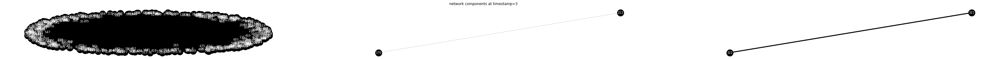

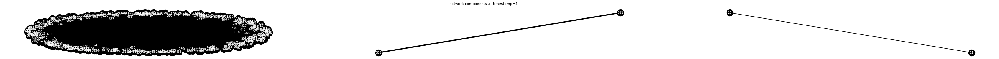

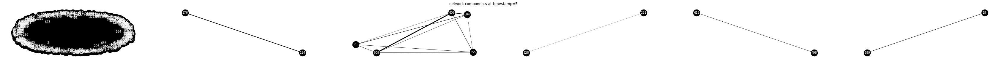

...

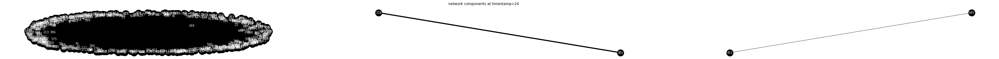

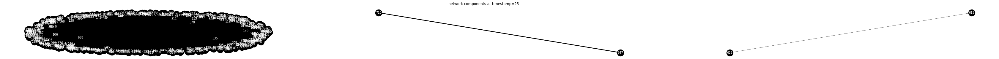

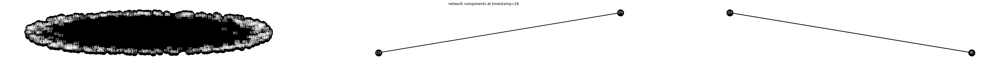

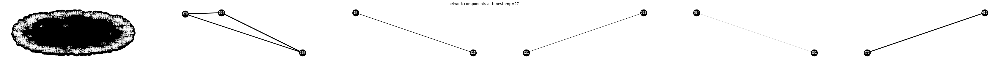

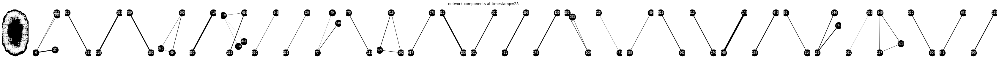

In [66]:
for i in range(1,29):
    print(f"{100*(i-1)//28}%", end="\r", flush=True)
    VisualizeBluetoothNetwork(df_bt_daily, i)

In [9]:
df_bt_hourly = df_bt.copy()
df_bt_hourly["# timestamp"] = df_bt["# timestamp"] // (60*60)
df_bt_hourly

,# timestamp,user_a,user_b,rssi
0,0,0,-1,0
1,0,1,-1,0
2,0,2,-1,0
3,0,3,-2,-88
4,0,5,-1,0
...,...,...,...,...
5474284,671,702,371,-79
5474285,671,703,-1,0
5474286,671,704,-1,0
5474287,671,705,-2,-90


<ipython-input-11-d54fd6208ea3>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, len(connected_components), figsize=(60, 3), squeeze=False)


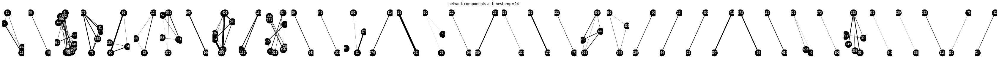

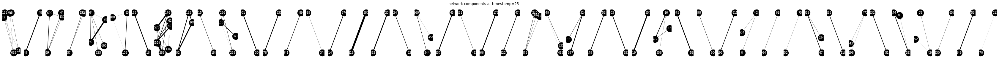

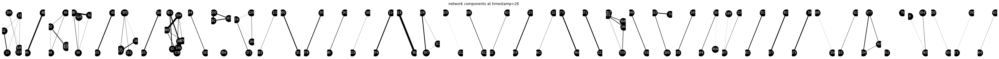

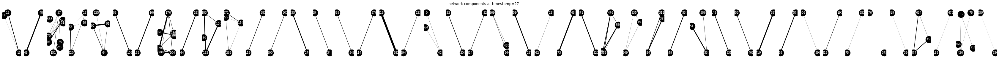

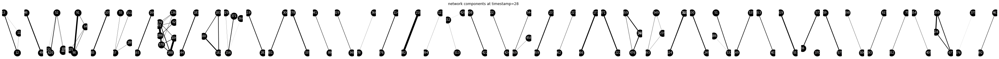

...

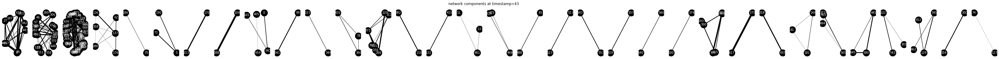

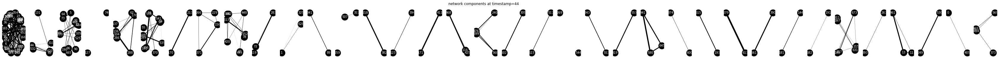

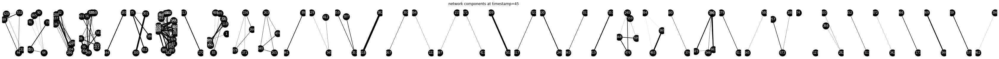

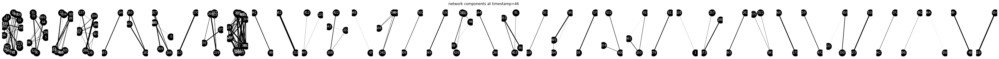

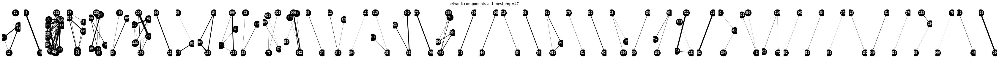

In [18]:
for i in range(24, 48):
    print(f"{100*(i-24)//24}%", end="\r", flush=True)
    VisualizeBluetoothNetwork(df_bt_hourly, i)

In [16]:
df_bt_6hrs = df_bt.copy()
df_bt_6hrs["# timestamp"] = df_bt["# timestamp"] // (60*60*6)
df_bt_6hrs

,# timestamp,user_a,user_b,rssi
0,0,0,-1,0
1,0,1,-1,0
2,0,2,-1,0
3,0,3,-2,-88
4,0,5,-1,0
...,...,...,...,...
5474284,111,702,371,-79
5474285,111,703,-1,0
5474286,111,704,-1,0
5474287,111,705,-2,-90


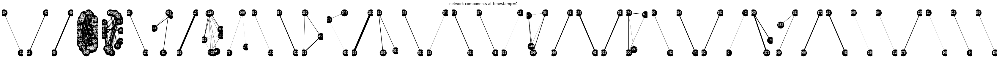

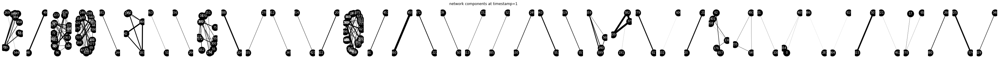

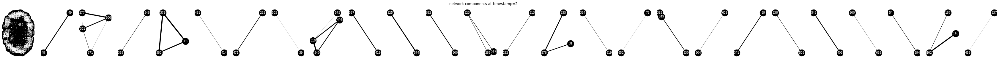

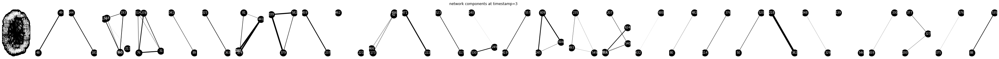

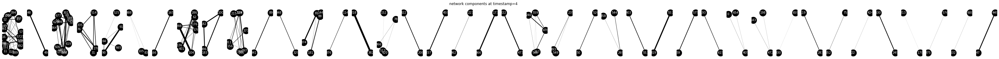

...

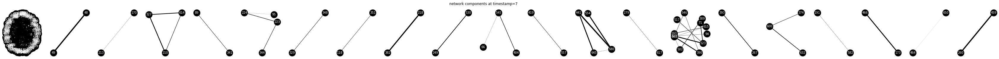

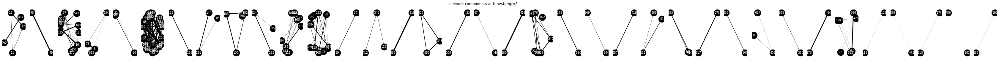

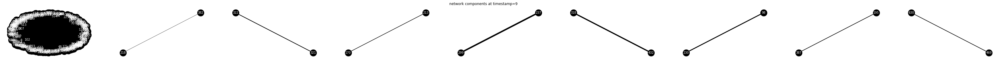

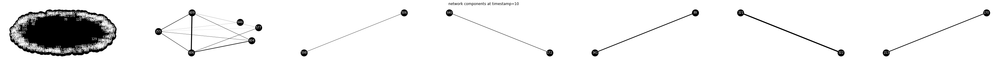

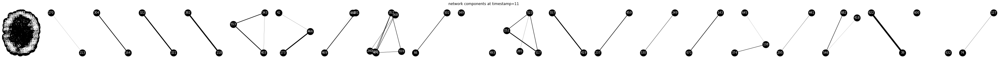

In [17]:
for i in range(12):
    print(f"{100*i//12}%", end="\r", flush=True)
    VisualizeBluetoothNetwork(df_bt_6hrs, i)

### cose da fare

- capire la conversione rssi-distanza

### idee

- plottare la degree distribution dei vari nodi al variare dei giorni della settimana. E confrontare diversi plot su settimane diverse.

- studiare la variazione, in funzione della discretizzazione temporale (ore/giorni/...), la dimensione dei cluster più grande, e del numero di cluster.

- controllare se i cluster ottenuti nelle 6 ore notturne sono composti dagli stessi nodi dei cluster orari nelle ore notturne, anche al variare dei giorni

- per ogni nodo il degree medio giornaliero (come misura della "socialità"), e plottare la distribuzione al variare dei nodi di questo degree medio

In [35]:
rssi = df_bt["rssi"].to_numpy()

In [36]:
np.unique(rssi, return_counts=True)

(array([-107, -106, -105, -104, -103, -102, -101, -100,  -99,  -98,  -97,
         -96,  -95,  -94,  -93,  -92,  -91,  -90,  -89,  -88,  -87,  -86,
         -85,  -84,  -83,  -82,  -81,  -80,  -79,  -78,  -77,  -76,  -75,
         -74,  -73,  -72,  -71,  -70,  -69,  -68,  -67,  -66,  -65,  -64,
         -63,  -62,  -61,  -60,  -59,  -58,  -57,  -56,  -55,  -54,  -53,
         -52,  -51,  -50,  -49,  -48,  -47,  -46,  -45,  -44,  -43,  -42,
         -41,  -40,  -39,  -38,  -37,  -36,  -35,  -34,  -33,  -32,  -31,
         -30,  -29,  -28,  -27,  -26,  -25,  -24,  -23,  -22,  -21,  -20,
         -19,  -18,  -17,  -16,  -15,  -14,  -13,  -12,  -11,  -10,   -8,
           0]),
 array([      1,       3,      12,      57,     133,     472,     730,
          32675,   43167,   74534,   88891,  115323,  132678,  147075,
         134404,  181226,  104397,  179679,   79161,  134427,  118153,
         150017,   85322,  111180,   96711,  104553,   90054,   95009,
          79143,   80192,   68427,

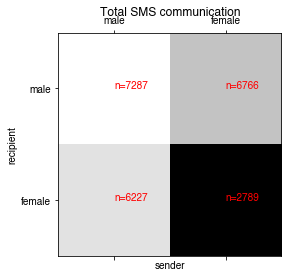

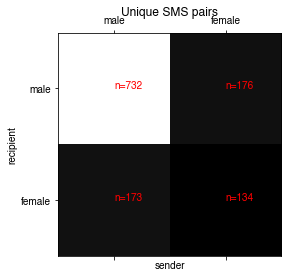

In [6]:
def VisualizeTextMessages(df_sms, df_genders):
    """Plots the SMS communication by gender of senders and recipients."""

    # Creates SMS network including gender of the senders.
    df_sms_with_gender_sender = pd.merge(
      df_sms, df_genders, left_on="sender", right_on="# user").rename(
          index=str, columns={
              "female": "female_sender"
          }).drop(
              "# user", axis=1)

  # Creates SMS network including gender of the recipients.
  df_sms_with_gender = pd.merge(
      df_sms_with_gender_sender,
      df_genders,
      left_on="recipient",
      right_on="# user").rename(
          index=str, columns={
              "female": "female_recipient"
          }).drop(
              "# user", axis=1)

  # Computes total communication (all messages) and number of unique pairs based
  # on sender and recipient gender.
  totals = np.zeros((2, 2))
  unique_pairs = np.zeros((2, 2))
  for female_sender in [0, 1]:
    for female_recipient in [0, 1]:
      totals[female_sender, female_recipient] = df_sms_with_gender[
          (df_sms_with_gender["female_sender"] == female_sender)
          &
          (df_sms_with_gender["female_recipient"] == female_recipient)].shape[0]
      unique_pairs[female_sender, female_recipient] = df_sms_with_gender[
          (df_sms_with_gender["female_sender"] == female_sender)
          & (df_sms_with_gender["female_recipient"] == female_recipient)][[
              "sender", "recipient"
          ]].drop_duplicates().shape[0]

  # Plots the breakdowns.
  plt.matshow(totals, cmap=plt.cm.gray)
  plt.grid(False)
  plt.xlabel("sender")
  plt.ylabel("recipient")
  plt.xticks([0, 1], ["male", "female"])
  plt.yticks([0, 1], ["male", "female"])
  [
      plt.text(
          sender,
          recipient,
          "n={}".format(int(totals[sender][recipient])),
          color="red")
      for sender, recipient in itertools.product([0, 1], [0, 1])
  ]
  plt.title("Total SMS communication")

  plt.matshow(unique_pairs, cmap=plt.cm.gray)
  plt.grid(False)
  plt.xlabel("sender")
  plt.ylabel("recipient")
  plt.xticks([0, 1], ["male", "female"])
  plt.yticks([0, 1], ["male", "female"])
  [
      plt.text(
          sender,
          recipient,
          "n={}".format(int(unique_pairs[sender][recipient])),
          color="red")
      for sender, recipient in itertools.product([0, 1], [0, 1])
  ]
  plt.title("Unique SMS pairs")


VisualizeTextMessages(df_sms, df_genders)

In [37]:
df_calls

,timestamp,caller,callee,duration
0,184,300,301,121
1,3920,512,299,670
2,5623,301,300,504
3,9252,401,457,-1
4,15466,512,0,5
...,...,...,...,...
3595,2414934,706,401,78
3596,2415585,218,382,48
3597,2416059,561,631,13
3598,2416368,323,392,4


<AxesSubplot:>

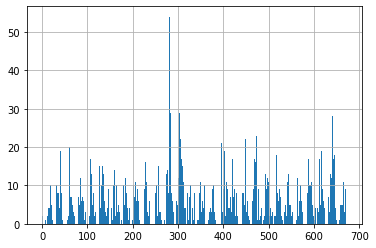

In [46]:
(df_calls["timestamp"] / 60/60).hist(bins=28*24)

In [47]:
df_sms

,timestamp,sender,recipient
0,18,370,512
1,37,512,370
2,126,370,512
3,134,0,512
4,312,137,136
...,...,...,...
24328,2415198,238,26
24329,2416413,137,136
24330,2417238,136,137
24331,2417633,323,392


In [63]:
df_facebook_friends

,# user_a,user_b
0,0,512
1,0,263
2,0,525
3,0,285
4,0,543
...,...,...
6424,510,737
6425,510,763
6426,255,566
6427,255,605


In [64]:
df_facebook_friends["user_b"]

0       512
1       263
2       525
3       285
4       543
       ... 
6424    737
6425    763
6426    566
6427    605
6428    507
Name: user_b, Length: 6418, dtype: int64

In [65]:
Gfacebook = nx.from_pandas_edgelist(df_facebook_friends, source="# user_a", target="user_b")

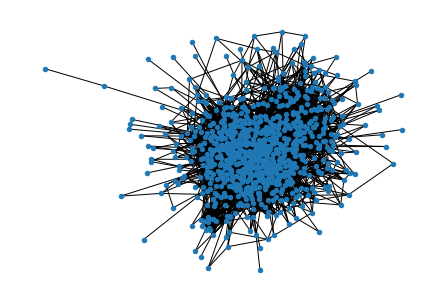

In [67]:
nx.draw(Gfacebook, node_size=20)

In [80]:
df_bt[(df_bt["rssi"] >= -80) & (df_bt["rssi"] < 0) & (df_bt["user_b"] != -2)]

,# timestamp,user_a,user_b,rssi
15,0,21,20,-73
36,0,49,48,-62
67,0,91,90,-60
74,0,101,57,-71
128,0,181,144,-78
...,...,...,...,...
5474272,2418900,694,598,-66
5474273,2418900,698,499,-75
5474278,2418900,702,78,-77
5474281,2418900,702,259,-58
